In [ ]:
import os
import torch
from rec_sys.tester import Tester
from experiment_helper import load_data
import argparse
import json
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from torch import nn

paths = {"user": "-", "item": "-", "user_item": "-  "}
paths["user"] = """"""
paths["item"] = """"""
paths["user_item"] = """"""
path_to_experiment = paths["user_item"]

config_path = os.path.join(path_to_experiment, 'params.json')
with open(config_path, 'r') as f:
    config = json.load(f)
    
config['device'] = 'cpu'
config_dict = config.copy()
config = argparse.Namespace(**config)

data_loaders_dict = load_data(config, is_train=False)
model_load_path = os.path.join(path_to_experiment, 'checkpoint_000000/best_model.pth')
tester = Tester(data_loaders_dict['test_loader'], config, model_load_path)
model = tester.model

user_prototype_model = model.user_feature_extractor.model_1
item_prototype_model = model.item_feature_extractor.model_1

user_embeddings = user_prototype_model.embedding_ext.embedding_layer.weight[:]
user_prototypes = user_prototype_model.prototypes

item_embeddings = item_prototype_model.embedding_ext.embedding_layer.weight[:]
item_prototypes = item_prototype_model.prototypes

In [4]:
import pandas as pd
import os

dataset_path = 'data/lfm2b-1mon'

users = pd.read_csv(os.path.join(dataset_path, 'users.tsv'), sep='\t')
users.rename(columns={'user_id': 'old_user_id'}, inplace=True)

test_dataset_path = dataset_path + '/listening_history_test.csv'
test_data = pd.read_csv(test_dataset_path)
test_data_user_augmented = test_data.merge(users, on='old_user_id')
test_data_user_augmented.head()

tracks = pd.read_csv(os.path.join(dataset_path, 'tracks_augmented.csv'))
tracks.rename(columns={'track_id': 'old_item_id'}, inplace=True)
tracks.head()

test_data_user_item_augmented = test_data_user_augmented.merge(tracks, on='old_item_id')
test_data_user_item_augmented.head()

test_data_user_item_augmented.rename(columns={'country_x': 'user_country', 'age':'user_age', 'gender_x': 'user_gender', 'artist': 'artist_name', 'track':'track_name', 'gender_y':'artist_gender', 'country_y':'artist_country'}, inplace=True)
test_data_user_item_augmented.head()

train_dataset = pd.read_csv(os.path.join(dataset_path, 'listening_history_train.csv'))
train_dataset.head()

train_dataset['old_user_id'].nunique()

test_data_user_item_augmented['user_num_interactions'] = train_dataset.groupby('user_id').size()[test_data_user_item_augmented['user_id']].values
test_data_user_item_augmented['item_num_interactions'] = train_dataset.groupby('item_id').size()[test_data_user_item_augmented['item_id']].values

# initial embedding plot

In [3]:
model

RecSys(
  (user_feature_extractor): ConcatenateFeatureExtractors(
    (model_1): PrototypeEmbedding(
      (embedding_ext): Embedding(
        (embedding_layer): Embedding(8418, 93)
      )
    )
    (model_2): EmbeddingW(
      (embedding_layer): Embedding(8418, 93)
      (linear_layer): Linear(in_features=93, out_features=92, bias=False)
    )
  )
  (item_feature_extractor): ConcatenateFeatureExtractors(
    (model_1): PrototypeEmbedding(
      (embedding_ext): Embedding(
        (embedding_layer): Embedding(63076, 93)
      )
    )
    (model_2): EmbeddingW(
      (embedding_layer): Embedding(63076, 93)
      (linear_layer): Linear(in_features=93, out_features=65, bias=False)
    )
  )
)

# Pre plotting, just metrics

In [11]:
user_embeddings.shape, user_prototypes.shape

(torch.Size([8418, 93]), torch.Size([65, 93]))

In [2]:
import numpy as np
import torch.nn.functional as F

    
def distance_to_prototypes(indices, prototypes, embeddings, mode='average', k=5):

    def average_distance_to_prototypes(idx):
        cosine_similarity = F.cosine_similarity(embeddings[idx].unsqueeze(0), prototypes, dim=1)
        return 1 - cosine_similarity.mean().item()

    def distance_to_closest_prototype(idx):
        closest_prototype_index = F.cosine_similarity(embeddings[idx].unsqueeze(0), prototypes, dim=1).argmax().item()
        cosine_similarity = F.cosine_similarity(embeddings[idx].unsqueeze(0), prototypes[closest_prototype_index], dim=1)
        return 1 - cosine_similarity.mean().item() 
        
    def distance_to_top_k_closest_prototypes(idx):
        closest_prototype_indices = F.cosine_similarity(embeddings[idx].unsqueeze(0), prototypes, dim=1).topk(k).indices
        cosine_similarity = F.cosine_similarity(embeddings[idx].unsqueeze(0), prototypes[closest_prototype_indices], dim=1)
        return 1 - cosine_similarity.mean().item()
    
    if mode == 'average':
        distance_function = average_distance_to_prototypes
    elif mode == 'closest':
        distance_function = distance_to_closest_prototype
    elif mode == 'top_k':
        distance_function = distance_to_top_k_closest_prototypes

    average_distances = []
    for idx in indices:
        average_distances.append(distance_function(idx))
    return np.array(average_distances)

## average distance to prototypes accross genders

In [13]:
male_user_ids = test_data_user_item_augmented.loc[test_data_user_item_augmented['user_gender']=='m']['user_id']
female_user_ids = test_data_user_item_augmented.loc[test_data_user_item_augmented['user_gender']=='f']['user_id']

In [14]:
female_user_ids

3       8315
8       7683
21      5424
22      2499
23      7603
        ... 
7582    6357
7584    3819
7593    4881
7595    2528
7596    8113
Name: user_id, Length: 1407, dtype: int64

In [47]:
user_ks = np.arange(1, user_prototypes.shape[0], 5)

In [16]:
male_distances = []
female_distances = []
for k in user_ks:
    male_distances.append(distance_to_prototypes(male_user_ids, user_prototypes, user_embeddings, mode='top_k', k=k).mean())
    female_distances.append(distance_to_prototypes(female_user_ids, user_prototypes, user_embeddings, mode='top_k', k=k).mean())

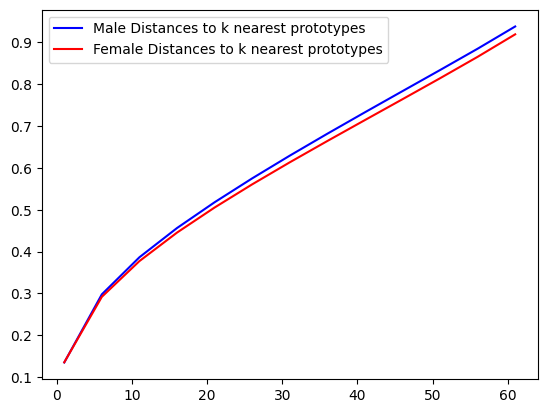

In [17]:
plt.plot(user_ks, male_distances, 'b', label='Male Distances to k nearest prototypes')
plt.plot(user_ks, female_distances, 'r', label='Female Distances to k nearest prototypes')
plt.legend()

In [ ]:
country_counts = test_data_user_item_augmented.groupby(['user_country']).size().sort_values(ascending=False)

pop_countries = list(country_counts[:3].index) 
mid_countries = list(country_counts[90:93].index)

pop_countries_ids = test_data_user_item_augmented[test_data_user_item_augmented['user_country'].isin(['IR'])]['user_id']
mid_countries_ids = test_data_user_item_augmented[test_data_user_item_augmented['user_country'].isin('mid_countries')]['user_id']

pop_distances = []
mid_distances = []
for k in user_ks:
    pop_distances.append(distance_to_prototypes(pop_countries_ids, user_prototypes, user_embeddings, mode='top_k', k=k).mean())
    mid_distances.append(distance_to_prototypes(mid_countries_ids, user_prototypes, user_embeddings, mode='top_k', k=k).mean())

In [18]:
country_counts = test_data_user_item_augmented.groupby(['user_country']).size().sort_values(ascending=False)

pop_countries = list(country_counts[:3].index) 
mid_countries = list(country_counts[90:93].index)

pop_countries_ids = test_data_user_item_augmented[test_data_user_item_augmented['user_country'].isin(pop_countries)]['user_id']
mid_countries_ids = test_data_user_item_augmented[test_data_user_item_augmented['user_country'].isin(mid_countries)]['user_id']

pop_distances = []
mid_distances = []
for k in user_ks:
    pop_distances.append(distance_to_prototypes(pop_countries_ids, user_prototypes, user_embeddings, mode='top_k', k=k).mean())
    mid_distances.append(distance_to_prototypes(mid_countries_ids, user_prototypes, user_embeddings, mode='top_k', k=k).mean())

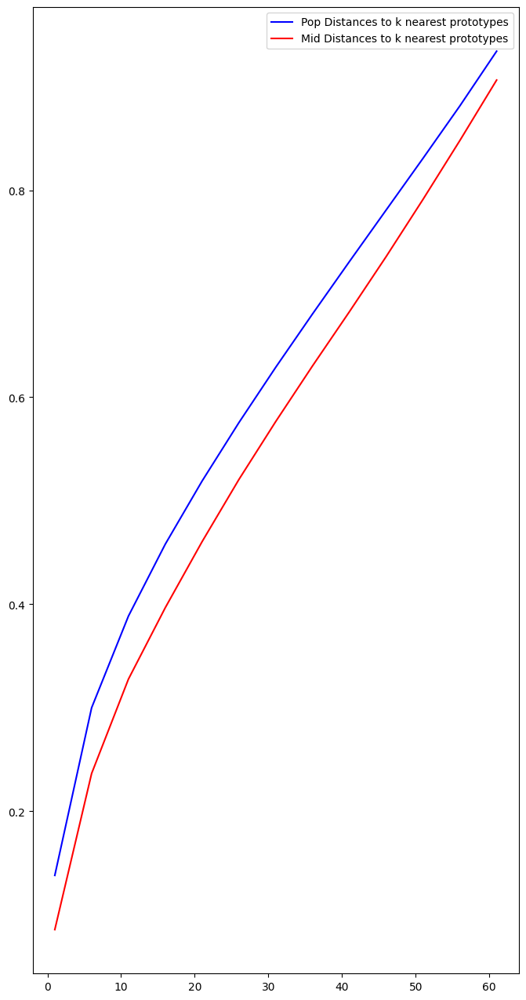

In [19]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8,16))

plt.plot(user_ks, pop_distances, 'b', label='Pop Distances to k nearest prototypes')
plt.plot(user_ks, mid_distances, 'r', label='Mid Distances to k nearest prototypes')
plt.legend()

In [20]:
test_data_user_item_augmented['user_num_interactions'].describe(percentiles=[0.1, 0.25, 0.3, 0.4, 0.5, 0.6, 0.75, 0.8, 0.9, 0.99])

count    7597.000000
mean      176.218639
std       162.824585
min         8.000000
10%        24.000000
25%        57.000000
30%        69.800000
40%        96.000000
50%       130.000000
60%       165.000000
75%       245.000000
80%       281.000000
90%       395.000000
99%       749.040000
max      1347.000000
Name: user_num_interactions, dtype: float64

In [42]:
len(percentiles.values())

5

In [100]:
user_ids_arr_popularity_groups = []

percentiles = {25: 57, 50: 130, 75: 245, 90: 395, 99: 749, 100: 1347}
per = [0] + list(percentiles.values())
percentilesss = list(percentiles.keys())
for i in range(len(per) - 1):
    user_ids_arr_popularity_groups.append(test_data_user_item_augmented.loc[(test_data_user_item_augmented['user_num_interactions'] > per[i]) & (test_data_user_item_augmented['user_num_interactions'] < per[i + 1])]['user_id'])

distances_arr = [[] for _ in range(len(user_ids_arr_popularity_groups))]
for user_group in range(len(user_ids_arr_popularity_groups)):
    for k in user_ks:
        distances_arr[user_group].append(distance_to_prototypes(user_ids_arr_popularity_groups[user_group], user_prototypes, user_embeddings, mode='top_k', k=k).mean())
distances_arr = np.array(distances_arr)

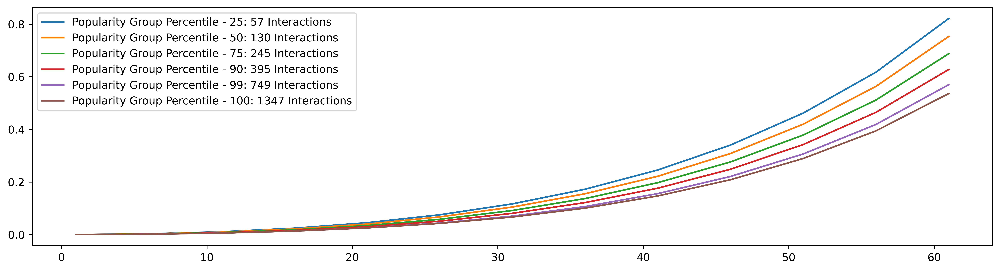

In [101]:
plt.figure(figsize=(16,4))
plt.rcParams['figure.dpi'] = 600


for i in range(len(user_ids_arr_popularity_groups)):
    plt.plot(user_ks, distances_arr[i]**5, label=f'Popularity Group Percentile - {percentilesss[i]}: {percentiles[percentilesss[i]]} Interactions')
plt.legend()

In [65]:
test_data_user_item_augmented['item_num_interactions'].describe(percentiles=[0.1, 0.25, 0.3, 0.4, 0.5, 0.6, 0.75, 0.8, 0.9, 0.99])

count    7597.000000
mean       39.839805
std        54.044908
min         5.000000
10%        10.000000
25%        12.000000
30%        14.000000
40%        17.000000
50%        21.000000
60%        27.000000
75%        45.000000
80%        54.000000
90%        89.000000
99%       265.000000
max       689.000000
Name: item_num_interactions, dtype: float64

# --------------------------------------

# ITEM SIDE!

# --------------------------------------

In [13]:
item_ks = np.arange(1, item_prototypes.shape[0], 5)

In [4]:
test_data_user_item_augmented.head()

,old_user_id,old_item_id,timestamp,user_id,item_id,user_country,user_age,user_gender,creation_time,artist_name,track_name,artist_gender,artist_country,user_num_interactions,item_num_interactions
0,2,41515706,2020-03-20 12:09:50,1980,27086,UK,35,m,2002-10-29 01:00:00,Torche,Times Missing,"[{'count': 1, 'name': 'hard rock'}, {'count': ...",NaN,116,27
1,36,17063812,2020-03-20 10:10:09,5960,1675,UK,29,m,2003-03-27 12:17:12,Lizzo,Good as Hell,Female,US,69,103
2,42,14940971,2020-03-17 13:36:22,5213,11687,RU,30,m,2003-04-10 01:07:48,Cassius,Feeling for You,NaN,FR,65,20
3,44,21288474,2020-03-10 07:57:21,8315,24324,US,29,f,2003-05-27 02:54:37,R.E.M.,It's the End of the World as We Know It (and I...,NaN,US,16,155
4,24824,21288474,2020-03-19 23:25:42,1168,24324,US,22,m,2008-09-16 02:22:15,R.E.M.,It's the End of the World as We Know It (and I...,NaN,US,332,155


In [6]:
test_data_user_item_augmented['artist_gender'].value_counts(), test_data_user_item_augmented['artist_gender'].nunique()

(Male                                                                                                                                                                                                                  986
 Female                                                                                                                                                                                                                351
 []                                                                                                                                                                                                                    210
 US                                                                                                                                                                                                                    134
 b6e035f4-3ce9-331c-97df-83397230b0df                                                                                       

In [16]:
male_item_ids = test_data_user_item_augmented.loc[test_data_user_item_augmented['artist_gender']=='Male']['item_id']
female_item_ids = test_data_user_item_augmented.loc[test_data_user_item_augmented['artist_gender']=='Female']['item_id']

male_distances = []
female_distances = []
for k in item_ks:
    male_distances.append(distance_to_prototypes(male_item_ids, item_prototypes, item_embeddings, mode='top_k', k=k).mean())
    female_distances.append(distance_to_prototypes(female_item_ids, item_prototypes, item_embeddings, mode='top_k', k=k).mean())

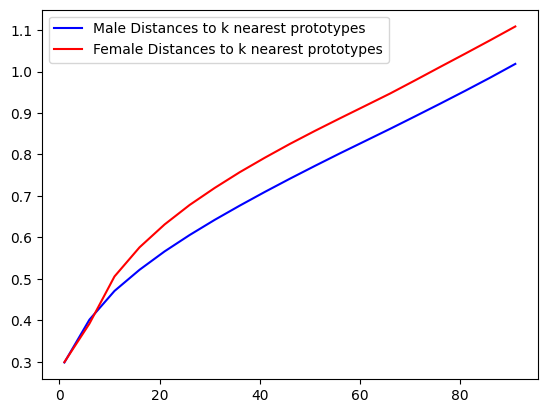

In [17]:
plt.plot(item_ks, male_distances, 'b', label='Male Distances to k nearest prototypes')
plt.plot(item_ks, female_distances, 'r', label='Female Distances to k nearest prototypes')
plt.legend()

In [ ]:
item_ids_arr_popularity_groups = []

percentiles = {25: 12, 50: 21, 75: 45, 90: 89, 99: 265, 100:689}
percentilesss = list(percentiles.keys())
per = [0] + list(percentiles.values())

for i in range(len(per) - 1):
    item_ids_arr_popularity_groups.append(test_data_user_item_augmented.loc[(test_data_user_item_augmented['item_num_interactions'] > per[i]) & (test_data_user_item_augmented['item_num_interactions'] <= per[i + 1])]['item_id'])
    
distances_arr = [[] for _ in range(len(item_ids_arr_popularity_groups))]
for item_group in range(len(item_ids_arr_popularity_groups)):
    for k in item_ks:
        distances_arr[item_group].append(distance_to_prototypes(item_ids_arr_popularity_groups[item_group], item_prototypes, item_embeddings, mode='top_k', k=k).mean())
distances_arr = np.array(distances_arr)

In [98]:
len(distances_arr), len(item_ids_arr_popularity_groups)

(6, 6)

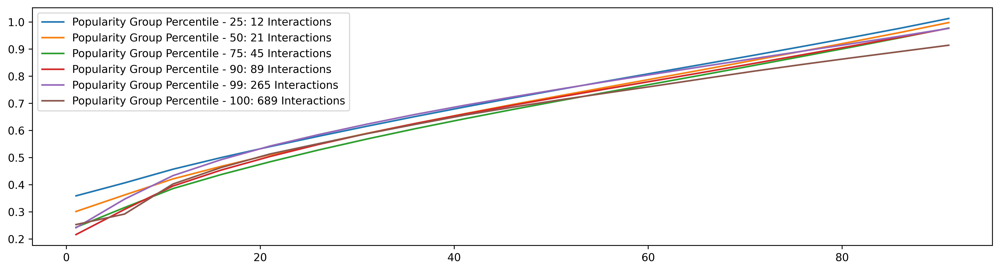

In [99]:
plt.figure(figsize=(16, 4))
plt.rcParams['figure.dpi'] = 600

for i in range(len(item_ids_arr_popularity_groups)):
    plt.plot(ks, distances_arr[i], label=f'Popularity Group Percentile - {percentilesss[i]}: {percentiles[percentilesss[i]]} Interactions')
plt.legend()

# each popular item has a prototype, and also in general they're closer to them.

# TODO:
- Performance parity accross sub groups
- Fairness in recommendation
    - Ginicoefficient
    - KL-divergence
    - Difference
    https://arxiv.org/pdf/2306.00403.pdf

    
- Discoverability Metrics


# Fairness Evaluation Set-up

In [71]:
eval.get_results()

{'ndcg@1': 0.1363744357329532,
 'hit_ratio@1': 0.1363744357329532,
 'ndcg@3': 0.22499631116612617,
 'hit_ratio@3': 0.29056783083867904,
 'ndcg@5': 0.26588397142213654,
 'hit_ratio@5': 0.39011641720123547,
 'ndcg@10': 0.32302836436450333,
 'hit_ratio@10': 0.5672368733665953,
 'ndcg@50': 0.40745558779884883,
 'hit_ratio@50': 0.9406034687574246}

In [75]:
len(test_data_user_item_augmented[test_data_user_item_augmented['user_gender'] == 'm'])

6190

In [76]:
len(test_data_user_item_augmented[test_data_user_item_augmented['user_gender'] == 'f'])

1407

In [77]:
len(test_data_user_item_augmented)

7597

In [4]:
from utilities.eval import Evaluator
import experiment_helper

def evaluate_for_user_subgroups(column='user_gender', subgroups=['m', 'f']):

    model.eval()

    test_loader = experiment_helper.load_data(config, is_train=False)['test_loader']
    groups = {subgroup:test_data_user_item_augmented[test_data_user_item_augmented[column] == subgroup]['user_id'] for subgroup in subgroups}


    print(groups)
    group_losses = {}
    group_evals = {}

    for group_name, subgroup in groups.items():
        test_loss = 0
        eval = Evaluator(model.n_users)
        for u_idxs, i_idxs, labels in test_loader:
            # in each batch, keep only the u_idxs that are in the subgroup
            mask = pd.Series(u_idxs).isin(subgroup)
            u_idxs, i_idxs, labels = u_idxs[mask], i_idxs[mask], labels[mask]
            
            if len(u_idxs) == 0:
                continue

            out = model(u_idxs, i_idxs).detach()
            test_loss += model.loss_func(out, labels).item()

            out = nn.Sigmoid()(out)
            out = out.to('cpu')

            eval.eval_batch(out, group_name)

        group_losses[group_name] = test_loss
        group_evals[group_name] = eval

    return group_losses, group_evals

In [ ]:
a, b = evaluate_for_user_subgroups()

In [73]:
b['m'].get_results()

{'ndcg@1': 0.09966737942504157,
 'hit_ratio@1': 0.09966737942504157,
 'ndcg@3': 0.16562142035858737,
 'hit_ratio@3': 0.21335234022333097,
 'ndcg@5': 0.19757644589761938,
 'hit_ratio@5': 0.29104300308861963,
 'ndcg@10': 0.23716252820979628,
 'hit_ratio@10': 0.4136374435732953,
 'ndcg@50': 0.3001732461656008,
 'hit_ratio@50': 0.6911380375386077}

In [74]:
b['f'].get_results()

{'ndcg@1': 0.026372059871703494,
 'hit_ratio@1': 0.026372059871703494,
 'ndcg@3': 0.04171439744807093,
 'hit_ratio@3': 0.052981705868377284,
 'ndcg@5': 0.04850216272128044,
 'hit_ratio@5': 0.06961273461629841,
 'ndcg@10': 0.05729826147238437,
 'hit_ratio@10': 0.09681634592539795,
 'ndcg@50': 0.07093714986427835,
 'hit_ratio@50': 0.1574008077928249}

In [ ]:
a, b = evaluate_for_user_subgroups(column='user_country', subgroups=['US', 'UK', 'IR', 'IT', 'CA', 'UA'])

In [13]:
cs = ['US', 'UK', 'IR', 'IT', 'CA', 'UA']
# for c in cs:
    # print(b[c].get_results())

In [27]:
metrics_arr = {'US':{'ndcg@1': 0.013898788310762652, 'hit_ratio@1': 0.013898788310762652, 'ndcg@3': 0.024514988066812893, 'hit_ratio@3': 0.03254929912093134, 'ndcg@5': 0.028691011196801154, 'hit_ratio@5': 0.042765502494654314, 'ndcg@10': 0.0352916268445735, 'hit_ratio@10': 0.06331670230458541, 'ndcg@50': 0.04631175092469105, 'hit_ratio@50': 0.11202185792349727},
'UK': {'ndcg@1': 0.009384651936326918, 'hit_ratio@1': 0.009384651936326918, 'ndcg@3': 0.014895680554848606, 'hit_ratio@3': 0.01900688999762414, 'ndcg@5': 0.017431129711380333, 'hit_ratio@5': 0.025184129246851983, 'ndcg@10': 0.020564597748923292, 'hit_ratio@10': 0.03492516037063435, 'ndcg@50': 0.02583245931222105, 'hit_ratio@50': 0.05785222143026847},
'IR': {'ndcg@1': 0.0004751722499406035, 'hit_ratio@1': 0.0004751722499406035, 'ndcg@3': 0.0005345687811831789, 'hit_ratio@3': 0.0005939653124257543, 'ndcg@5': 0.0007799638024102237, 'hit_ratio@5': 0.0011879306248515087, 'ndcg@10': 0.000936826510180812, 'hit_ratio@10': 0.001663102874792112, 'ndcg@50': 0.0011552341722803861, 'hit_ratio@50': 0.002613447374673319},
'IT': {'ndcg@1': 0.0020194820622475647, 'hit_ratio@1': 0.0020194820622475647, 'ndcg@3': 0.0034378982287106242, 'hit_ratio@3': 0.004514136374435733, 'ndcg@5': 0.004122921905117656, 'hit_ratio@5': 0.006177239249227845, 'ndcg@10': 0.004964507661789813, 'hit_ratio@10': 0.008790686623901164, 'ndcg@50': 0.0065724988081509944, 'hit_ratio@50': 0.015918270373010215},
'CA': {'ndcg@1': 0.0015443098123069613, 'hit_ratio@1': 0.0015443098123069613, 'ndcg@3': 0.0027067686530563967, 'hit_ratio@3': 0.003682584937039677, 'ndcg@5': 0.003340630942189326, 'hit_ratio@5': 0.005226894749346638, 'ndcg@10': 0.004150397333737732, 'hit_ratio@10': 0.007721549061534806, 'ndcg@50': 0.005842106917147634, 'hit_ratio@50': 0.01508671893561416},
'UA': {'ndcg@1': 0.00273224043715847, 'hit_ratio@1': 0.00273224043715847, 'ndcg@3': 0.004316110305298219, 'hit_ratio@3': 0.00546448087431694, 'ndcg@5': 0.0049144290798722465, 'hit_ratio@5': 0.00688999762413875, 'ndcg@10': 0.005851158975359613, 'hit_ratio@10': 0.009859824186267522, 'ndcg@50': 0.007126602838510524, 'hit_ratio@50': 0.015680684248039915}}

import matplotlib.pyplot as plt

# Extract the countries and metrics from the metrics_arr
countries = metrics_arr.keys()
metrics = list(metrics_arr['IR'].keys())



<Figure size 3200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

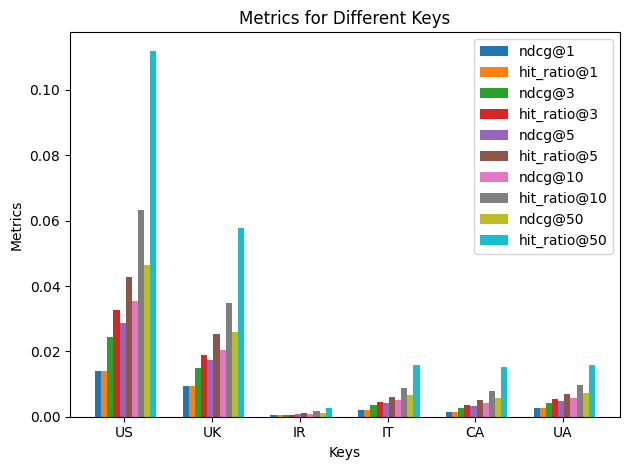

In [44]:
import matplotlib.pyplot as plt

# Dictionary of metrics
metrics_arr = {
    'US': {'ndcg@1': 0.013898788310762652, 'hit_ratio@1': 0.013898788310762652, 'ndcg@3': 0.024514988066812893, 'hit_ratio@3': 0.03254929912093134, 'ndcg@5': 0.028691011196801154, 'hit_ratio@5': 0.042765502494654314, 'ndcg@10': 0.0352916268445735, 'hit_ratio@10': 0.06331670230458541, 'ndcg@50': 0.04631175092469105, 'hit_ratio@50': 0.11202185792349727},
    'UK': {'ndcg@1': 0.009384651936326918, 'hit_ratio@1': 0.009384651936326918, 'ndcg@3': 0.014895680554848606, 'hit_ratio@3': 0.01900688999762414, 'ndcg@5': 0.017431129711380333, 'hit_ratio@5': 0.025184129246851983, 'ndcg@10': 0.020564597748923292, 'hit_ratio@10': 0.03492516037063435, 'ndcg@50': 0.02583245931222105, 'hit_ratio@50': 0.05785222143026847},
    'IR': {'ndcg@1': 0.0004751722499406035, 'hit_ratio@1': 0.0004751722499406035, 'ndcg@3': 0.0005345687811831789, 'hit_ratio@3': 0.0005939653124257543, 'ndcg@5': 0.0007799638024102237, 'hit_ratio@5': 0.0011879306248515087, 'ndcg@10': 0.000936826510180812, 'hit_ratio@10': 0.001663102874792112, 'ndcg@50': 0.0011552341722803861, 'hit_ratio@50': 0.002613447374673319},
    'IT': {'ndcg@1': 0.0020194820622475647, 'hit_ratio@1': 0.0020194820622475647, 'ndcg@3': 0.0034378982287106242, 'hit_ratio@3': 0.004514136374435733, 'ndcg@5': 0.004122921905117656, 'hit_ratio@5': 0.006177239249227845, 'ndcg@10': 0.004964507661789813, 'hit_ratio@10': 0.008790686623901164, 'ndcg@50': 0.0065724988081509944, 'hit_ratio@50': 0.015918270373010215},
    'CA': {'ndcg@1': 0.0015443098123069613, 'hit_ratio@1': 0.0015443098123069613, 'ndcg@3': 0.0027067686530563967, 'hit_ratio@3': 0.003682584937039677, 'ndcg@5': 0.003340630942189326, 'hit_ratio@5': 0.005226894749346638, 'ndcg@10': 0.004150397333737732, 'hit_ratio@10': 0.007721549061534806, 'ndcg@50': 0.005842106917147634, 'hit_ratio@50': 0.01508671893561416},
    'UA': {'ndcg@1': 0.00273224043715847, 'hit_ratio@1': 0.00273224043715847, 'ndcg@3': 0.004316110305298219, 'hit_ratio@3': 0.00546448087431694, 'ndcg@5': 0.0049144290798722465, 'hit_ratio@5': 0.00688999762413875, 'ndcg@10': 0.005851158975359613, 'hit_ratio@10': 0.009859824186267522, 'ndcg@50': 0.007126602838510524, 'hit_ratio@50': 0.015680684248039915}
}

plt.figure(figsize=(32, 8))
# Extracting keys and metrics
keys = list(metrics_arr.keys())
metrics = list(metrics_arr[keys[0]].keys())

# Plotting
plt.figure(figsize=(12, 8))  # Adjust size here
bar_width = 0.07

num_metrics = len(metrics)
index = range(len(keys))

fig, ax = plt.subplots()
for i in range(num_metrics):
    metric_values = [metrics_arr[key][metrics[i]] for key in keys]
    ax.bar([x + i * bar_width for x in index], metric_values, bar_width, label=metrics[i])

ax.set_xlabel('Keys')
ax.set_ylabel('Metrics')
ax.set_title('Metrics for Different Keys')
ax.set_xticks([x + 0.3 for x in index])
ax.set_xticklabels(keys)
ax.legend()

plt.tight_layout()
plt.show()


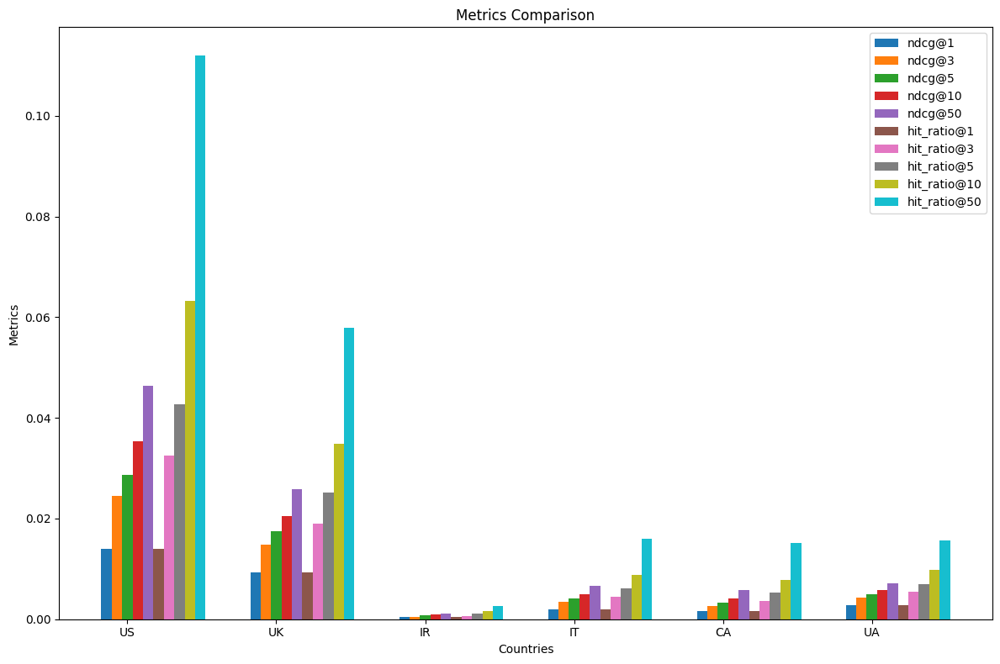

In [46]:
import matplotlib.pyplot as plt

metrics_arr = {
    'US': {'ndcg@1': 0.013898788310762652, 'hit_ratio@1': 0.013898788310762652, 'ndcg@3': 0.024514988066812893, 'hit_ratio@3': 0.03254929912093134, 'ndcg@5': 0.028691011196801154, 'hit_ratio@5': 0.042765502494654314, 'ndcg@10': 0.0352916268445735, 'hit_ratio@10': 0.06331670230458541, 'ndcg@50': 0.04631175092469105, 'hit_ratio@50': 0.11202185792349727},
    'UK': {'ndcg@1': 0.009384651936326918, 'hit_ratio@1': 0.009384651936326918, 'ndcg@3': 0.014895680554848606, 'hit_ratio@3': 0.01900688999762414, 'ndcg@5': 0.017431129711380333, 'hit_ratio@5': 0.025184129246851983, 'ndcg@10': 0.020564597748923292, 'hit_ratio@10': 0.03492516037063435, 'ndcg@50': 0.02583245931222105, 'hit_ratio@50': 0.05785222143026847},
    'IR': {'ndcg@1': 0.0004751722499406035, 'hit_ratio@1': 0.0004751722499406035, 'ndcg@3': 0.0005345687811831789, 'hit_ratio@3': 0.0005939653124257543, 'ndcg@5': 0.0007799638024102237, 'hit_ratio@5': 0.0011879306248515087, 'ndcg@10': 0.000936826510180812, 'hit_ratio@10': 0.001663102874792112, 'ndcg@50': 0.0011552341722803861, 'hit_ratio@50': 0.002613447374673319},
    'IT': {'ndcg@1': 0.0020194820622475647, 'hit_ratio@1': 0.0020194820622475647, 'ndcg@3': 0.0034378982287106242, 'hit_ratio@3': 0.004514136374435733, 'ndcg@5': 0.004122921905117656, 'hit_ratio@5': 0.006177239249227845, 'ndcg@10': 0.004964507661789813, 'hit_ratio@10': 0.008790686623901164, 'ndcg@50': 0.0065724988081509944, 'hit_ratio@50': 0.015918270373010215},
    'CA': {'ndcg@1': 0.0015443098123069613, 'hit_ratio@1': 0.0015443098123069613, 'ndcg@3': 0.0027067686530563967, 'hit_ratio@3': 0.003682584937039677, 'ndcg@5': 0.003340630942189326, 'hit_ratio@5': 0.005226894749346638, 'ndcg@10': 0.004150397333737732, 'hit_ratio@10': 0.007721549061534806, 'ndcg@50': 0.005842106917147634, 'hit_ratio@50': 0.01508671893561416},
    'UA': {'ndcg@1': 0.00273224043715847, 'hit_ratio@1': 0.00273224043715847, 'ndcg@3': 0.004316110305298219, 'hit_ratio@3': 0.00546448087431694, 'ndcg@5': 0.0049144290798722465, 'hit_ratio@5': 0.00688999762413875, 'ndcg@10': 0.005851158975359613, 'hit_ratio@10': 0.009859824186267522, 'ndcg@50': 0.007126602838510524, 'hit_ratio@50': 0.015680684248039915}
}

# Extract keys and metrics
keys = list(metrics_arr.keys())
metrics = list(metrics_arr[keys[0]].keys())

# Order metrics
ordered_metrics = []
for metric in metrics:
    if 'ndcg' in metric:
        ordered_metrics.append(metric)
for metric in metrics:
    if 'hit_ratio' in metric:
        ordered_metrics.append(metric)

# Plotting
plt.figure(figsize=(12, 8))  # Adjust size here
bar_width = 0.07
index = [i for i in range(len(keys))]

for i, metric in enumerate(ordered_metrics):
    values = [metrics_arr[key][metric] for key in keys]
    plt.bar([x + i * bar_width for x in index], values, bar_width, label=metric)

plt.xlabel('Countries')
plt.ylabel('Metrics')
plt.title('Metrics Comparison')
plt.xticks([i + 2 * bar_width for i in range(len(keys))], keys)
plt.legend()
plt.tight_layout()
plt.show()


In [ ]:
# Plot the NDCG metrics
for metric in ndcg_metrics:
    plt.plot(countries, metric, marker='o')

# Plot the hit ratio metrics
for metric in hit_ratio_metrics:
    plt.plot(countries, metric, marker='o')

# Set the x-axis label
plt.xlabel('Country')

# Set the y-axis label
plt.ylabel('Metric')

# Set the title
plt.title('NDCG and Hit Ratio Metrics for each Country')

# Show the plot
plt.show()


In [15]:
for i in range(len(cs)):
    c = cs[i]
    for metrics in metrics_arr[i]:
        print(c, '---->', metrics)
    print('\n\n\n\n')

US ----> ndcg@1
US ----> hit_ratio@1
US ----> ndcg@3
US ----> hit_ratio@3
US ----> ndcg@5
US ----> hit_ratio@5
US ----> ndcg@10
US ----> hit_ratio@10
US ----> ndcg@50
US ----> hit_ratio@50





UK ----> ndcg@1
UK ----> hit_ratio@1
UK ----> ndcg@3
UK ----> hit_ratio@3
UK ----> ndcg@5
UK ----> hit_ratio@5
UK ----> ndcg@10
UK ----> hit_ratio@10
UK ----> ndcg@50
UK ----> hit_ratio@50





IR ----> ndcg@1
IR ----> hit_ratio@1
IR ----> ndcg@3
IR ----> hit_ratio@3
IR ----> ndcg@5
IR ----> hit_ratio@5
IR ----> ndcg@10
IR ----> hit_ratio@10
IR ----> ndcg@50
IR ----> hit_ratio@50





IT ----> ndcg@1
IT ----> hit_ratio@1
IT ----> ndcg@3
IT ----> hit_ratio@3
IT ----> ndcg@5
IT ----> hit_ratio@5
IT ----> ndcg@10
IT ----> hit_ratio@10
IT ----> ndcg@50
IT ----> hit_ratio@50





CA ----> ndcg@1
CA ----> hit_ratio@1
CA ----> ndcg@3
CA ----> hit_ratio@3
CA ----> ndcg@5
CA ----> hit_ratio@5
CA ----> ndcg@10
CA ----> hit_ratio@10
CA ----> ndcg@50
CA ----> hit_ratio@50





UA ----> ndcg@1
UA ----> hit_r

In [ ]:
from utilities.eval import Evaluator
import experiment_helper

model.eval()

test_loader = experiment_helper.load_data(config, is_train=False)['test_loader']

male_users = test_data_user_item_augmented[test_data_user_item_augmented['user_gender'] == 'm']
female_users = test_data_user_item_augmented[test_data_user_item_augmented['user_gender'] == 'f']

groups = {'male': male_users['user_id'], 'female': female_users['user_id']}

group_losses = {}
group_evals = {}

for group_name, subgroup in groups.items():
    test_loss = 0
    eval = Evaluator(model.n_users)
    for u_idxs, i_idxs, labels in test_loader:
        # in each batch, keep only the u_idxs that are in the subgroup
        mask = pd.Series(u_idxs).isin(subgroup)
        u_idxs, i_idxs, labels = u_idxs[mask], i_idxs[mask], labels[mask]
        if len(u_idxs) == 0:
            continue

        out = model(u_idxs, i_idxs).detach()
        test_loss += model.loss_func(out, labels).item()

        out = nn.Sigmoid()(out)
        out = out.to('cpu')

        eval.eval_batch(out, group_name)

    group_losses[group_name] = test_loss
    group_evals[group_name] = eval

print(group_losses)
print(group_evals)

In [50]:
group_evals['male'].get_results(), group_evals['female'].get_results()

({'ndcg@1': 0.10144927536231885,
  'hit_ratio@1': 0.10144927536231885,
  'ndcg@3': 0.1660713466143995,
  'hit_ratio@3': 0.21501544309812307,
  'ndcg@5': 0.1966866623576045,
  'hit_ratio@5': 0.28949869327631267,
  'ndcg@10': 0.2370277075248606,
  'hit_ratio@10': 0.4144689950106914,
  'ndcg@50': 0.2996662033287023,
  'hit_ratio@50': 0.6912568306010929},
 {'ndcg@1': 0.026728439059158945,
  'hit_ratio@1': 0.026728439059158945,
  'ndcg@3': 0.041121897410311616,
  'hit_ratio@3': 0.05203136136849608,
  'ndcg@5': 0.04930053386662214,
  'hit_ratio@5': 0.07198859586600143,
  'ndcg@10': 0.057840345827857666,
  'hit_ratio@10': 0.09847944880019006,
  'ndcg@50': 0.07116442140286058,
  'hit_ratio@50': 0.1574008077928249})

In [3]:
data_loaders_dict = load_data(config, is_train=False)
tester = Tester(data_loaders_dict['test_loader'], config, model_load_path)
metric_values = tester.test()


TypeError: Hit_Ratio_at_k_batch() got multiple values for argument 'k'

minorities do have their own prototypes but are not well represented, in the end, everything is the same

# Plotting

In [180]:
user_prototype_model = model.user_feature_extractor.model_1
item_prototype_model = model.item_feature_extractor.model_1

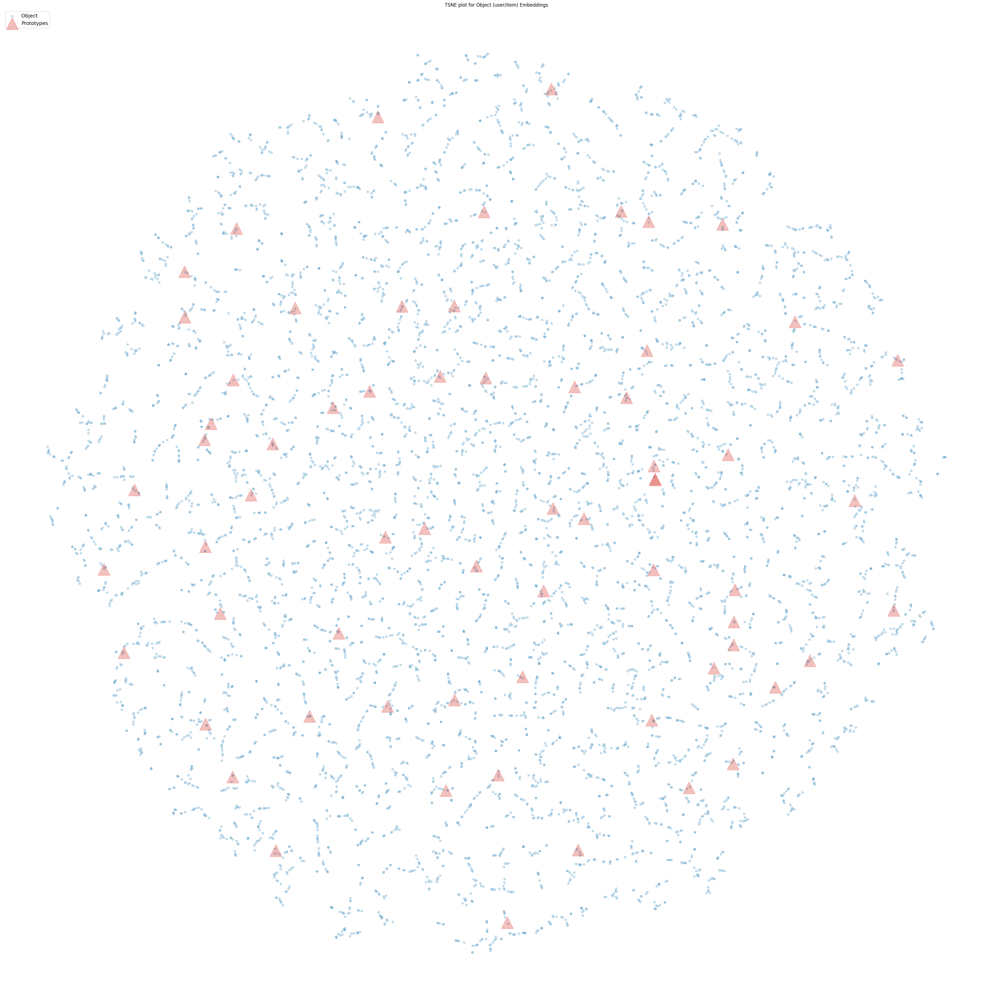

In [181]:
from utilities.explanations_utils import weight_visualization, get_top_k_items, tsne_plot

user_embeddings = user_prototype_model.embedding_ext.embedding_layer.weight[:]
user_prototypes = user_prototype_model.prototypes
tsne_plot(objects=user_embeddings.detach().numpy(), prototypes=user_prototypes.detach().numpy())

# Read Data

In [ ]:
test_data_user_item_augmented['user_num_interactions'].plot.hist()

In [ ]:
test_data_user_item_augmented['item_num_interactions'].plot.hist()

In [ ]:
# put the year of the creation time instead of datetime object
test_data_user_item_augmented['creation_year'] = pd.to_datetime(test_data_user_item_augmented['creation_time']).dt.year
test_data_user_item_augmented['creation_year'].plot.hist()

In [185]:
test_data_user_item_augmented.head()

,old_user_id,old_item_id,timestamp,user_id,item_id,user_country,user_age,user_gender,creation_time,artist_name,track_name,artist_gender,artist_country,user_num_interactions,item_num_interactions,creation_year
0,2,41515706,2020-03-20 12:09:50,1980,27086,UK,35,m,2002-10-29 01:00:00,Torche,Times Missing,"[{'count': 1, 'name': 'hard rock'}, {'count': ...",NaN,116,27,2002
1,36,17063812,2020-03-20 10:10:09,5960,1675,UK,29,m,2003-03-27 12:17:12,Lizzo,Good as Hell,Female,US,69,103,2003
2,42,14940971,2020-03-17 13:36:22,5213,11687,RU,30,m,2003-04-10 01:07:48,Cassius,Feeling for You,NaN,FR,65,20,2003
3,44,21288474,2020-03-10 07:57:21,8315,24324,US,29,f,2003-05-27 02:54:37,R.E.M.,It's the End of the World as We Know It (and I...,NaN,US,16,155,2003
4,24824,21288474,2020-03-19 23:25:42,1168,24324,US,22,m,2008-09-16 02:22:15,R.E.M.,It's the End of the World as We Know It (and I...,NaN,US,332,155,2008


In [186]:
from utilities.explanations_utils import weight_visualization, get_top_k_items, tsne_plot


user_indices = test_data_user_item_augmented['user_id'].values # sample the users you want to plot
# user_indices = user_indices[:100]

attributes_dict = {'user_gender':[], 'user_age':[], 'user_country':[], 'creation_year':[],'user_num_interactions':[]}
test_data_user_item_augmented_arr = test_data_user_item_augmented[test_data_user_item_augmented['user_id'].isin(user_indices)][list(attributes_dict.keys())].values


In [187]:
# indices
user_indices = user_indices.astype(int)
for i, key in enumerate(attributes_dict.keys()):
    print(i, key)
    attributes_dict[key] = test_data_user_item_augmented_arr[:, i]

0 user_gender
1 user_age
2 user_country
3 creation_year
4 user_num_interactions


In [188]:
user_embeddings = user_prototype_model.embedding_ext.embedding_layer.weight[user_indices]
user_prototypes = user_prototype_model.prototypes

# User based
### 1. gender
### 2. age
### 3. creation year
### 4 num interactions
### 5. country

In [ ]:
tsne_plot(objects=user_embeddings.detach().numpy(), prototypes=user_prototypes.detach().numpy(), labels=attributes_dict['user_gender'], title='user_gender')

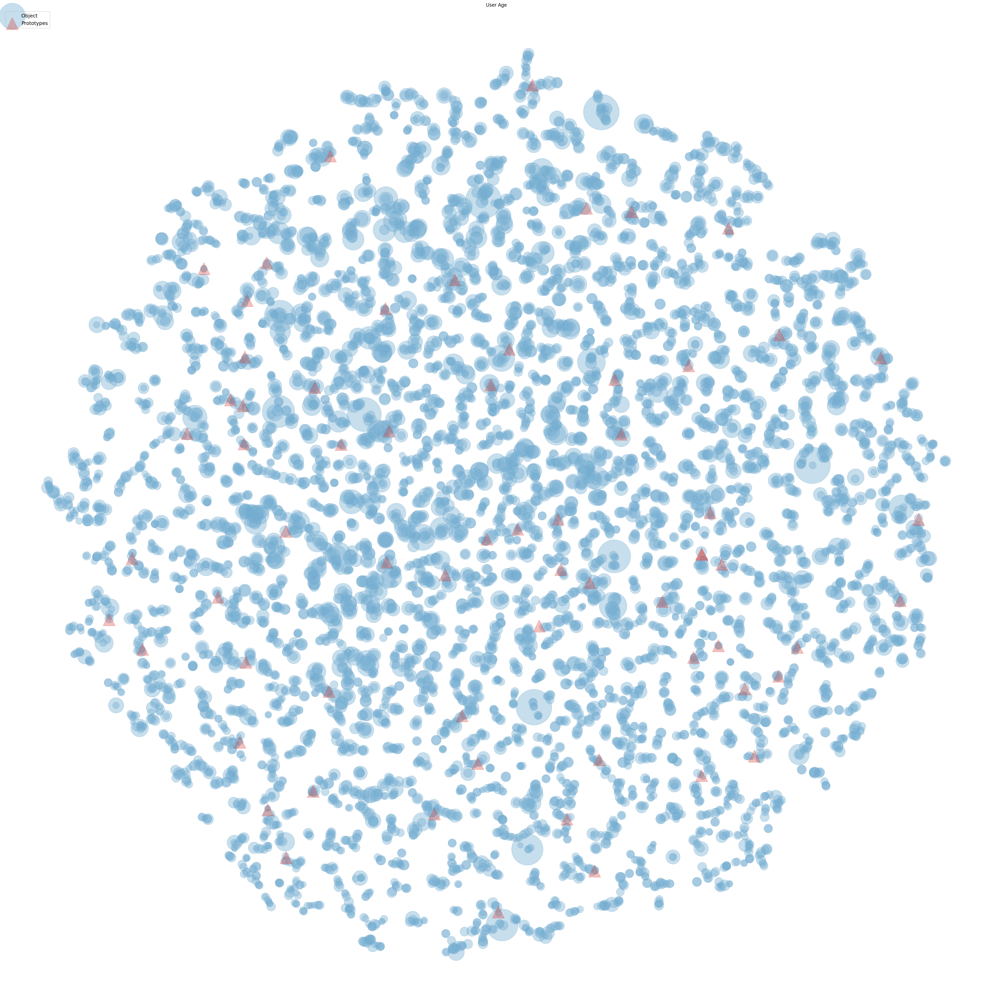

In [190]:
tsne_plot(objects=user_embeddings.detach().numpy(), prototypes=user_prototypes.detach().numpy(), sizes=attributes_dict['user_age'].astype(float)**2, title='User Age')

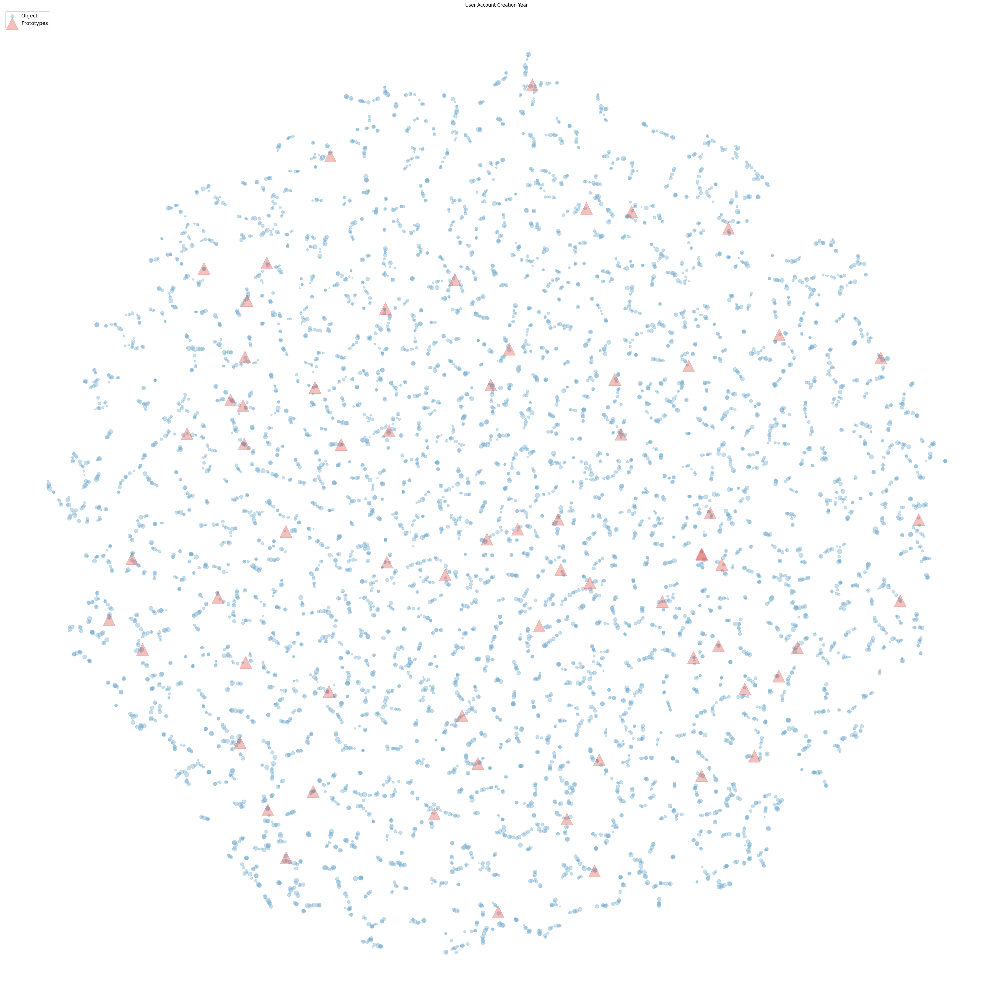

In [191]:
tsne_plot(objects=user_embeddings.detach().numpy(), prototypes=user_prototypes.detach().numpy(), sizes=(attributes_dict['creation_year'] - 2000).astype(float)**2, title='User Account Creation Year')

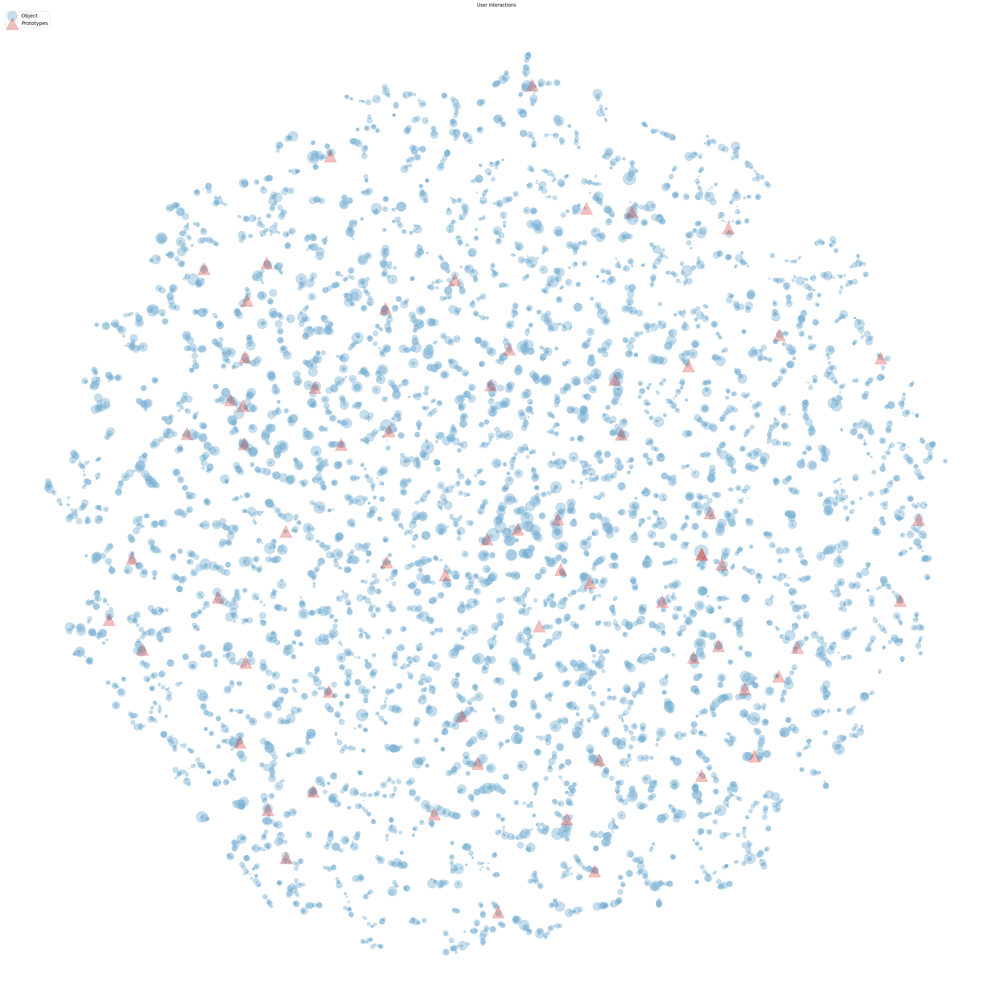

In [192]:
tsne_plot(objects=user_embeddings.detach().numpy(), prototypes=user_prototypes.detach().numpy(), sizes=attributes_dict['user_num_interactions'].astype(float), title='User Interactions')

In [193]:
country_counts = test_data_user_item_augmented.groupby(['user_country']).size().sort_values(ascending=False)
chosen_countries = list(country_counts[:3].index) + list(country_counts[40:43].index)

In [194]:
chosen_countries

['US', 'BR', 'RU', 'IR', 'NZ', 'EE']

In [ ]:
# keep only the rows with the chosen countries
test_data_user_item_augmented_chosen_countries = test_data_user_item_augmented[test_data_user_item_augmented['user_country'].isin(chosen_countries)]
user_countries = test_data_user_item_augmented_chosen_countries['user_country'].values

user_indices = test_data_user_item_augmented_chosen_countries['user_id'].values
user_embeddings = user_prototype_model.embedding_ext.embedding_layer.weight[user_indices]

tsne_plot(objects=user_embeddings.detach().numpy(), prototypes=user_prototypes.detach().numpy(), labels=user_countries, title='User Countries')

# Tracks based
### 1. gender
### 2. num_interactions
### 3. country

In [5]:
(test_data_user_item_augmented['artist_gender'].value_counts())

Male                                                                                                                                                                                                                  986
Female                                                                                                                                                                                                                351
[]                                                                                                                                                                                                                    210
US                                                                                                                                                                                                                    134
b6e035f4-3ce9-331c-97df-83397230b0df                                                                                            

In [6]:
from utilities.explanations_utils import weight_visualization, get_top_k_items, tsne_plot

item_indices = test_data_user_item_augmented['item_id'].values.astype(int) # sample the users you want to plot
# item_indices = item_indices[:100]

In [7]:
attributes_dict = {'artist_gender':[], 'artist_country':[], 'item_num_interactions':[]}
test_data_user_item_augmented_arr = test_data_user_item_augmented[test_data_user_item_augmented['item_id'].isin(item_indices)][list(attributes_dict.keys())].values
for i, key in enumerate(attributes_dict.keys()):
    print(i, key)
    attributes_dict[key] = test_data_user_item_augmented_arr[:, i]

0 artist_gender
1 artist_country
2 item_num_interactions


In [8]:
item_embeddings = item_prototype_model.embedding_ext.embedding_layer.weight[item_indices]
item_prototypes = item_prototype_model.prototypes

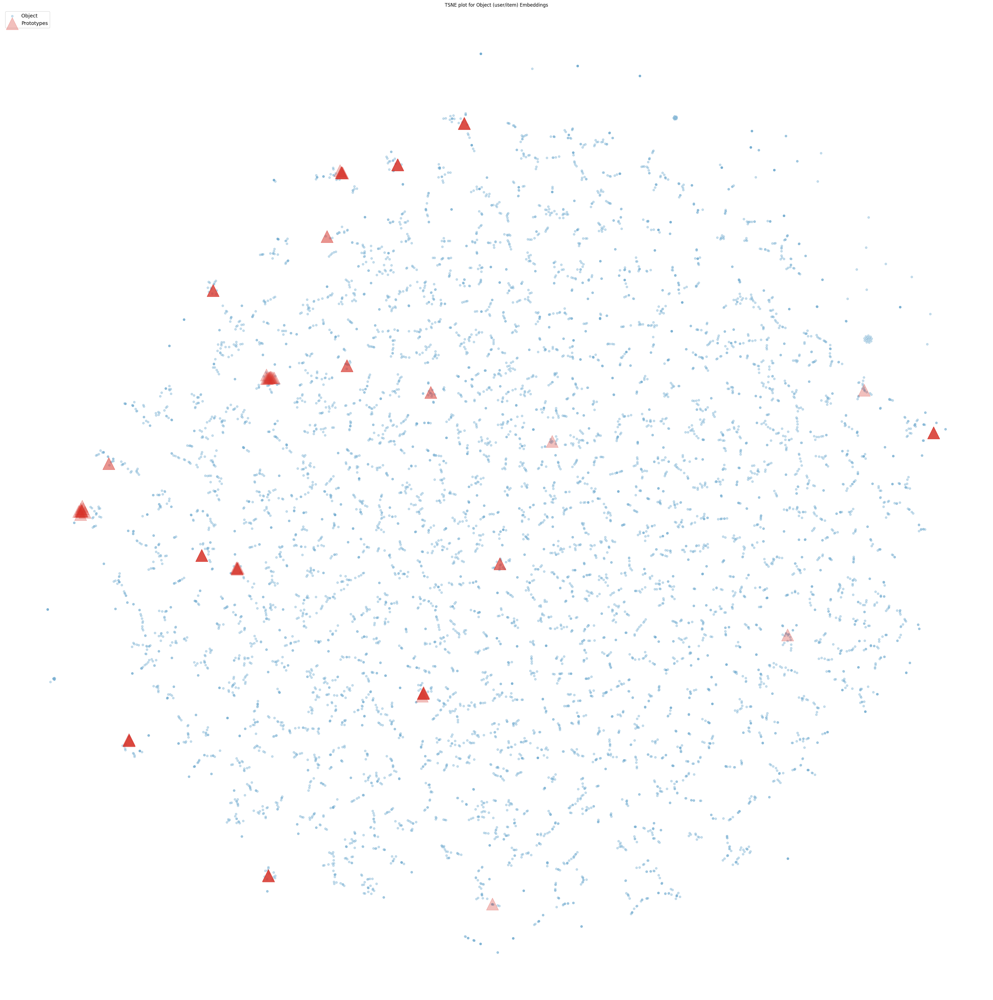

In [9]:
tsne_plot(item_embeddings.detach().numpy(), item_prototypes.detach().numpy())

In [10]:
attributes_dict['item_num_interactions']

array([27, 103, 20, ..., 20, 13, 59], dtype=object)

In [11]:
test_data_user_item_augmented[['user_id', 'item_num_interactions']].sort_values('item_num_interactions', ascending=False)

,user_id,item_num_interactions
2104,6195,689
2108,370,689
2107,1366,689
2106,5729,689
2105,3549,689
...,...,...
1339,4359,6
4431,1674,5
5407,6268,5
4432,7397,5


<Axes: ylabel='Frequency'>

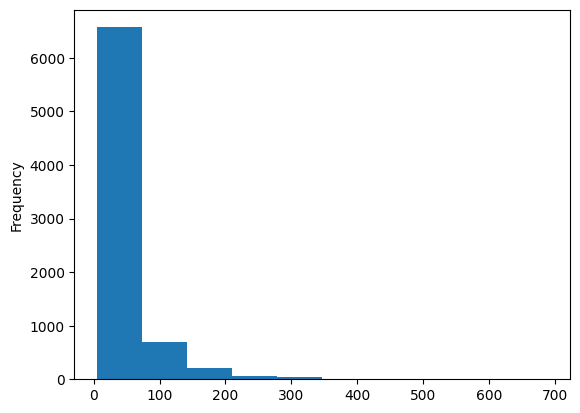

In [12]:
test_data_user_item_augmented.item_num_interactions.plot.hist()

In [13]:
attributes_dict['item_num_interactions'].astype(float)

array([ 27., 103.,  20., ...,  20.,  13.,  59.])

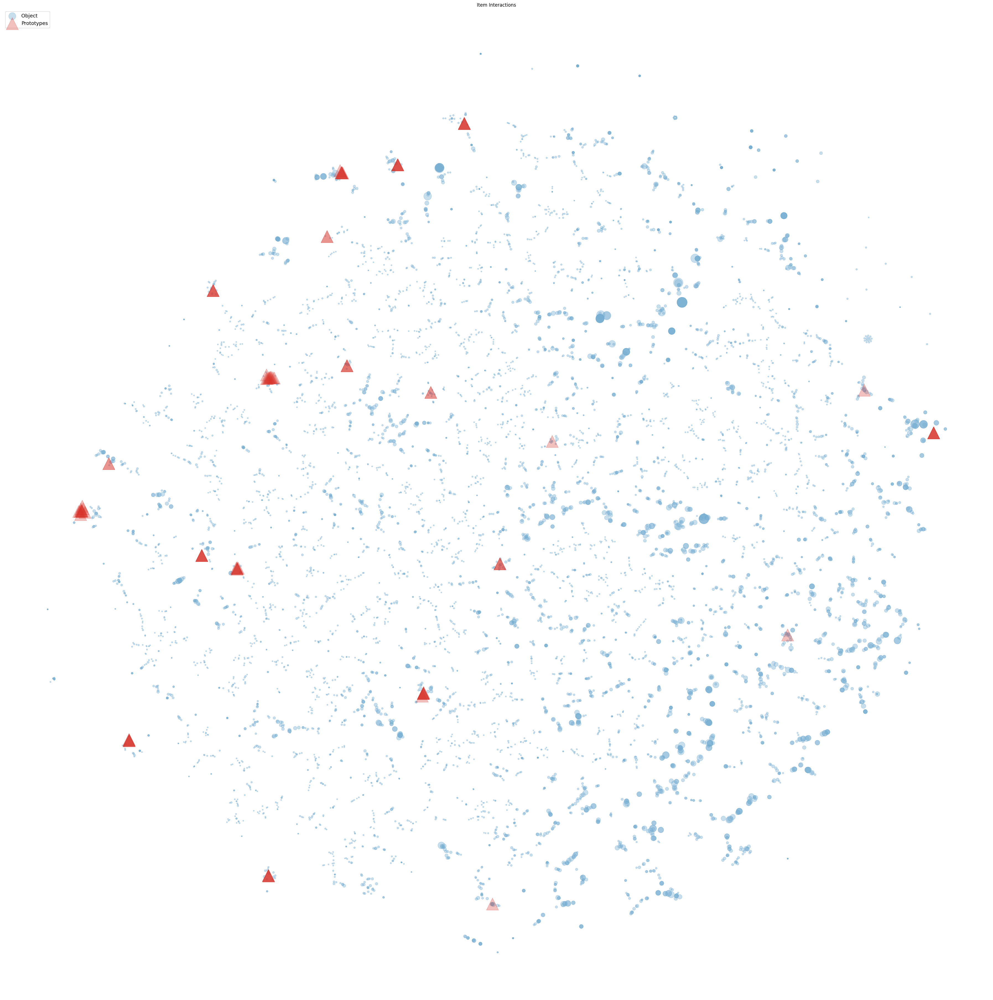

In [14]:
tsne_plot(item_embeddings.detach().numpy(), item_prototypes.detach().numpy(), sizes=attributes_dict['item_num_interactions'].astype(float), title='Item Interactions')

In [15]:
# clean the data, only Female and Male genders
item_indices = test_data_user_item_augmented.loc[test_data_user_item_augmented.artist_gender.isin(['Male', 'Female'])]['item_id'].values
item_embeddings = item_prototype_model.embedding_ext.embedding_layer.weight[item_indices]
item_prototypes = item_prototype_model.prototypes

In [16]:
attributes_dict['artist_gender'] = test_data_user_item_augmented[test_data_user_item_augmented['item_id'].isin(item_indices)]['artist_gender'].values

In [17]:
attributes_dict

{'artist_gender': array(['Female', 'Female', 'Female', ..., 'Female', 'Male', 'Female'],
       dtype=object),
 'artist_country': array([nan, 'US', 'FR', ..., 'NO', nan, 'US'], dtype=object),
 'item_num_interactions': array([27, 103, 20, ..., 20, 13, 59], dtype=object)}

In [ ]:
tsne_plot(objects=item_embeddings.detach().numpy(), prototypes=item_prototypes.detach().numpy(), labels=attributes_dict['artist_gender'])

In [19]:
country_counts = test_data_user_item_augmented.groupby(['user_country']).size().sort_values(ascending=False)
chosen_countries = list(country_counts[3:15].index)

In [20]:
test_data_user_item_augmented.loc[test_data_user_item_augmented.artist_country.isin(chosen_countries)].groupby('artist_country').size()

artist_country
DE    225
ES      1
FI     91
FR     91
IT     24
MX     10
NL     51
NO     75
PL     44
SE    188
UA      2
dtype: int64

In [ ]:
# clean the data, only Female and Male genders
item_indices = test_data_user_item_augmented.loc[test_data_user_item_augmented.artist_country.isin(chosen_countries)]['item_id'].values

item_embeddings = item_prototype_model.embedding_ext.embedding_layer.weight[item_indices]
item_prototypes = item_prototype_model.prototypes

attributes_dict['artist_country'] = test_data_user_item_augmented[test_data_user_item_augmented['item_id'].isin(item_indices)]['artist_country'].values

tsne_plot(objects=item_embeddings.detach().numpy(), prototypes=item_prototypes.detach().numpy(), labels=attributes_dict['artist_country'], title='TSNE FOR more COMMON COUNTRIES')

#### TODO: check dimensions for u and i

In [22]:
ss = """65, 92, 0.5816
54, 48, 0.5556
92, 36, 0.5486
89, 17, 0.5347
94, 46, 0.5331
48, 76, 0.4338
59, 82, 0.4313
18, 98, 0.4269
21, 68, 0.4124
63, 21, 0.4072"""

ss = ss.split('\n')

run_hr = [0] * len(ss)

for i, run in enumerate(ss):
    run_hr[i] = [float(r) for r in run.split(', ')]

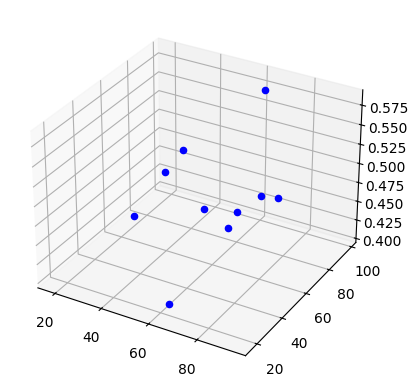

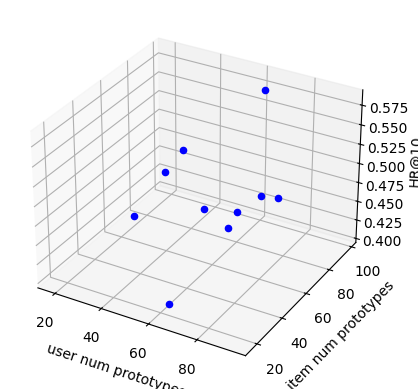

<Figure size 2000x2000 with 0 Axes>

In [23]:
# plot 3d, x axis is run_hr[i][0], y axis is run_hr[i][1], z axis is run_hr[i][2]

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure()

# increase figsize

ax = fig.add_subplot(111, projection='3d')

for i in range(len(run_hr)):
    ax.scatter(run_hr[i][0], run_hr[i][1], run_hr[i][2], c='b', marker='o')
    
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

ax.set_xlabel('user num prototypes')  # Add title for x-axis
ax.set_ylabel('item num prototypes')  # Add title for x-axis
ax.set_zlabel('HR@10')

for i in range(len(run_hr)):
    ax.scatter(run_hr[i][0], run_hr[i][1], run_hr[i][2], c='b', marker='o')

fig = plt.figure(figsize=(20, 20))
